# Magic the Gathering Card Reader

*by Ryland Peck, 12/8/2023, 2023* 

## Introduction

A card game that I have always loved is Magic the Gathering. Something about magic that draws people in is the thousands of ways to play and win the game. An unfortunate issue of so many ways to have fun is the number of cards that exist in the game. A single year can see over a thousand Magic cards introduced into the game, and a player can have an extremely difficult time keeping track of all the cards. 

I thought an interesting solution to this would be to use machine learning and machine vision to do their best at identifying MTG (Magic The Gathering) cards. The first idea was to train a neural network on cards and attempt to identify them vaguely by their artwork, symbols, and key text on the cards. The process to make this had many variations, trails, and issues, but the end results I could not be happier with. I have many ways I wish to improve this system and will discuss them at the end. 


## The MTG Scanner Process

## The inital view of the card scanner:

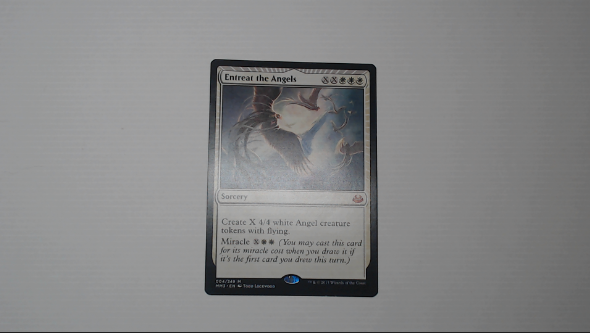

The first step that I had in this process was to use a web camera and properly Identify a magic the gathering card. I used the OpenCV library for my image work. This image library has a ton of resources for things such as edge detection and filtering that I could use. For the first part of pre-processing, I apply grayscale to my image, follow it up with a gauss filter, and finally run a canny edge detector over the entire image. Once this is done there is the step of finding a magic card in the jumbled mess of edges


This kind of processing had been done before on playing cards. I found one repo that gave some inspiration to how to detect a card correctly: https://github.com/EdjeElectronics/OpenCV-Playing-Card-Detector/blob/master/Cards.py



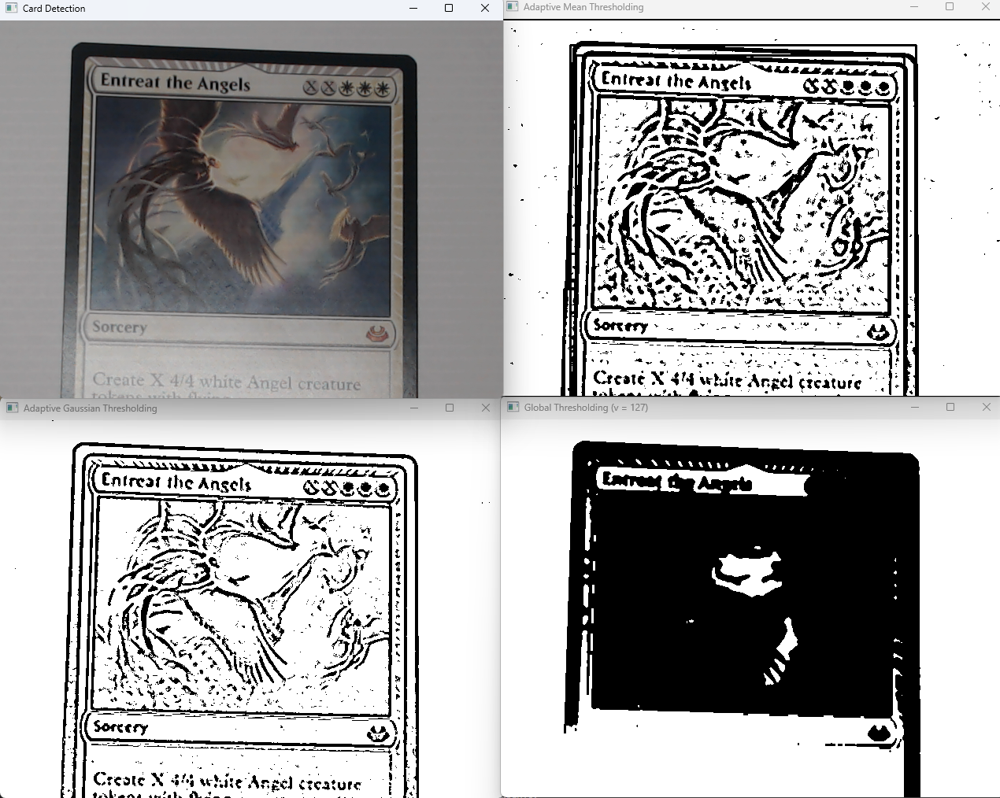

Above is one of my first attempts at deciding how to detect an image using thresholding. Thresholding was eventually removed from the CUDA version of the code, but was left in the CPU bound version out of curiosity to attempt to compare the results. Overall, I do not think there is a difference but think using thresholding could lead to speedups in the future.

In this repo, it uses a cards minimum and maximum area when subjected to canny edge detection and pulls them out accordingly. With this, playing cards, or in this case MTG cards, are correctly found using their edge detection. The bounding box can then be drawn on the image. There is also a bounding box that is constructed more closely hugging the Image. The closer red one is considered the ROI (Region of Interest). The ROI is important later to properly extract the image and process it for reading.


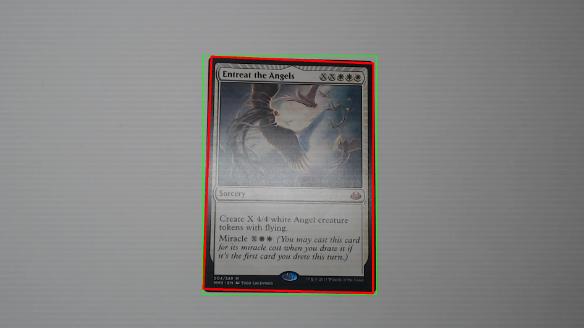
###### **Image with bounding boxes**


 I realized early on that the card I have will never be straight on in the view, and I cannot really work with an image that is not straight. Images at angles are much harder to read from in any detection algorithm. So, the next step is to align the card, and correct the orientation if it happens to be sideways. For the alignment, the cv2 library comes with an amazing method of approxpolydp, which draws us our image from the corners. Once we have this, we can correct the card orientation with some rotational math. The outputted card is now straight up and ready for further processing. 

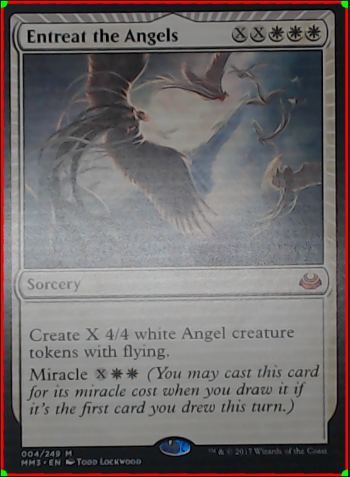
###### **ROI Extracted from Overall Image, and correctly aligned**


### Text Recognition

With the card now appropriately displayed, the next step is to read the card and approximate any good data from it. 

For my initial testing, I had used pytesseract with my own made library of MTG fonts, however this was not as efficient when compared to an already existing python package, EasyOCR. Easy OCR has its own image recognition models trained for text recognition and runs extremely fast. This ran a lot better then my attempt at a custom version, so the custom version was dropped early in development. It was at this stage of processing I also realized that I would not need the entire card to process it, so the top part of the card is cut off and is the only part fed to EasyOCR for test reading. this helps speed up the detection, and cuts out on all the random gibberish made from running text recognition over the entire card.



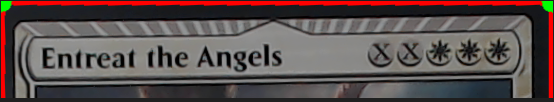
###### **Cropped Title of Card**


After this section of the card was cut out, I tried some different upscaling techniques to make it work better, including a Deep Learning upscaling called EDSR to no avail. For the image processing I settled on a simple kernel to attempt to clear up any noise left on the image.

This image is processed back through easyOCR and the resulting text is called to ScryFallAPI to learn the card.

Scryfall is a website solely devoted to MTG cards and is where I got my data for training the neural network described later. Scryfall has a search function for "fuzzy" matching for magic the gathering card names. For the card, "The One Ring" I could get a result of "Teh Ne Ring" And Scrfalls Api correctly gives me back "The One Ring". It is extremely helpful. 

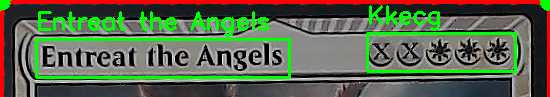
###### **Easy OCR output of card**

### Emblem Identification

Another part of the card identification process was an attempt to determine the Symbol of the MTG card, and get a specific set identification for this card. For MTG, one card may be reprinted multiple times, such as the card "Entreat the Angels". This card occurs in multiple sets and the one determining factor is the symbol in the middle right of the card, or the tiny text on the bottom left of the card. The bottom left text can be hard to discern, and I wanted to attempt to get it by a Network trained for classification on the card.

For the emblem identification network, the networks were trained year by year. The entirety of the MTG cards of the year were downloaded, and processed. The process was to crop the image down to only the emblem. For some sets, there are alternate cards that do not fit this format, and had to be manually culled. 

These networks were trained year by year and intended to be used using another Scryfall call. 

##### **This functionality is not implemented**

The Scryfall Api can provide every year a card has been printed, as well as every set. Once the Api would have returned this list, multiple Neural networks could be run with the highest CI determining the set the program thinks it is. Unfortunately this is not quite finished for reasons that are examined in the section below for improvements. For this report, only the 2017 Network is used.

##### More about this network

The data for this network was obtained using the Scryfall Api. The Scryfall Api allowed me to gather by set, and sort each set into a folder. These folders were then correlated under the proper year the sets were made in. The folders were then combed over by a different program to cut the folders size down to what is seen below in the training results, cropped to only have their emblems per class. I also left all of them as colored images to attempt to do the calculations fine on the colors. 

The network was made using the prebuild RESNET50 model. I chose this model due to its fantastic scoring on the CIFAR10 dataset, a well-known classification dataset. This is classification problem, so I assumed it would be done well. The RESNET50 model is loaded without weights. The model is trained for 15 epochs, and is saved to a .pth file to be used later. This training worked surprisingly well, allowing me to have close to 97% for each year. Very Good results

Example below:

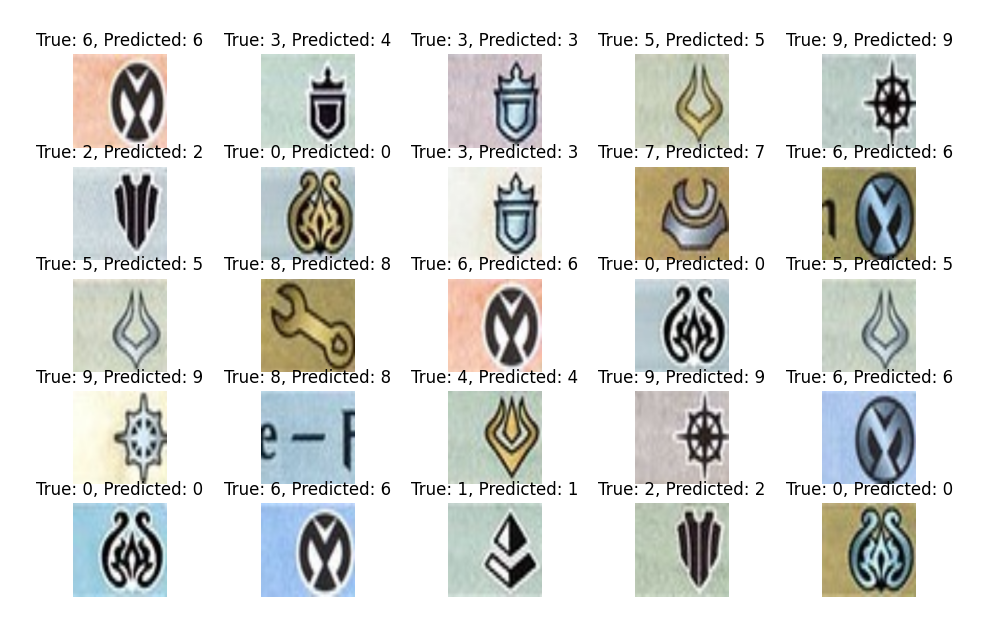

For the given example, numbers are used instead of names. There is a name file saved with each to allow for translation of the image:

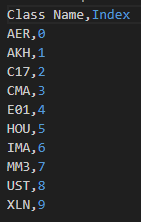

With the model created, another crop is created  to try to give the model its best results when attempting to classify the model

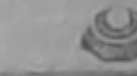
###### **Cropped Emblem from Source Card**


### Emblem Results

This worked to a varying degree. Some cards were not able to ever have a correct emblem stated, while others could only occasionally get the proper set. Part of this is due to the cropping. The only way I figured out how to-do my cropping was to use a percentage and get the area. This leads to wildly differing crop jobs, depending on the corrected orientation cards resolution. I believe that this, along with the very plain training set leads to issues of correct identification. A better version in the future would be much more variation in the training data for the network, with proper augments. 

## Results

Example outputs from ten cards tested:

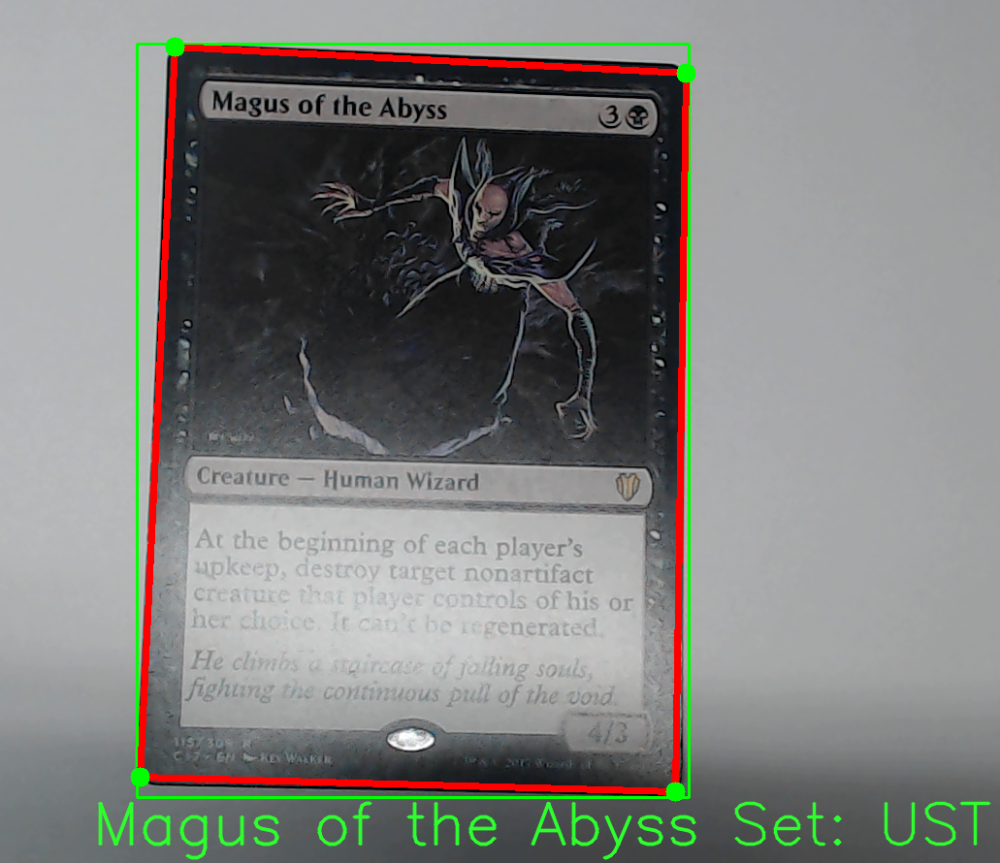

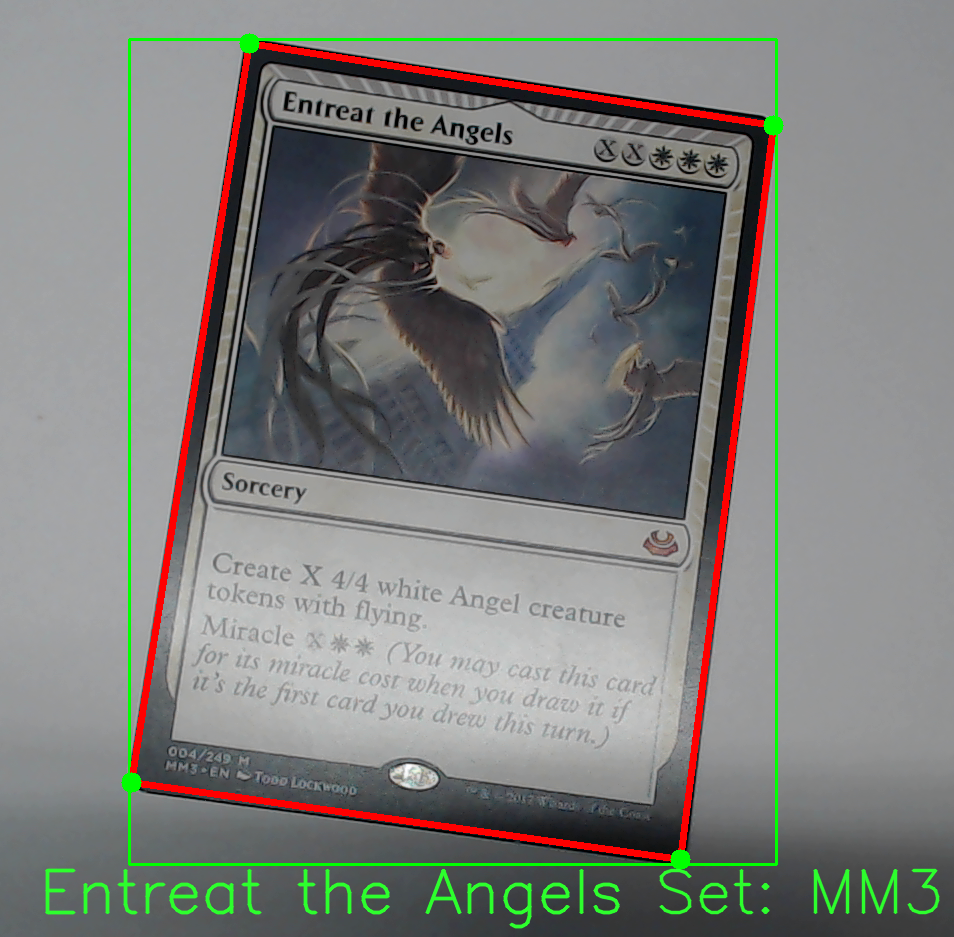

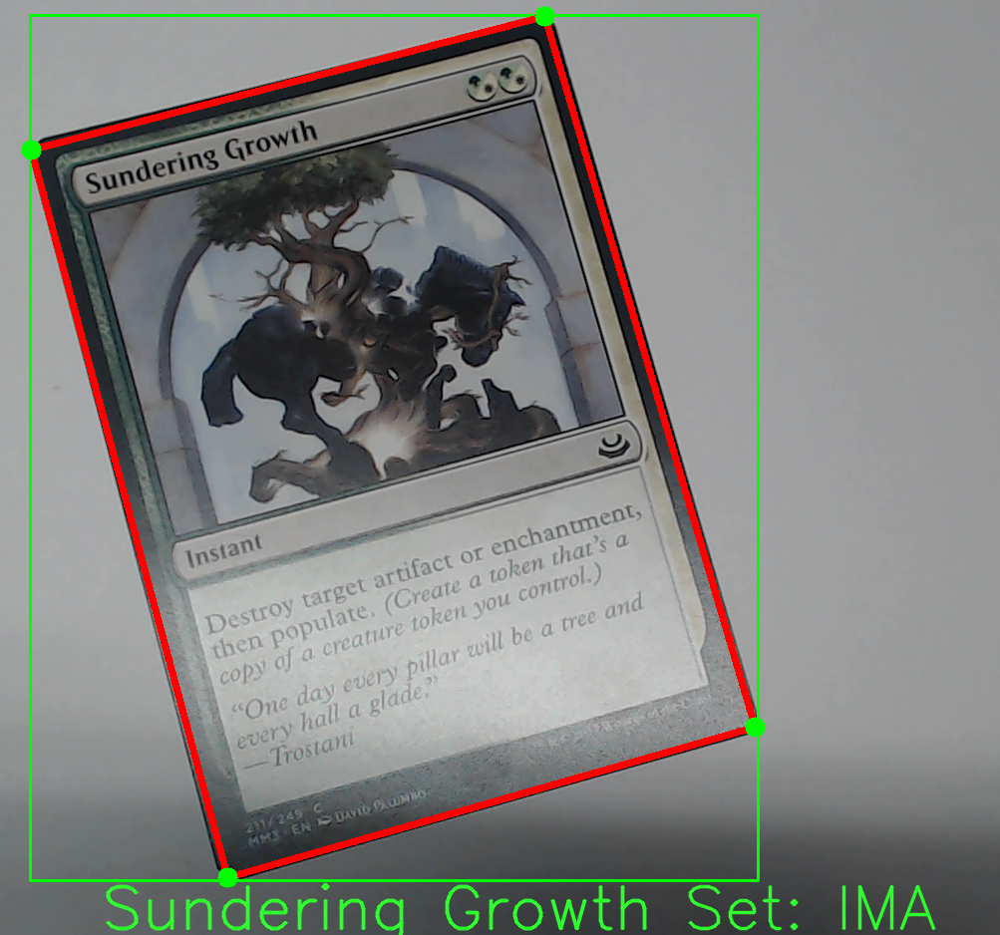

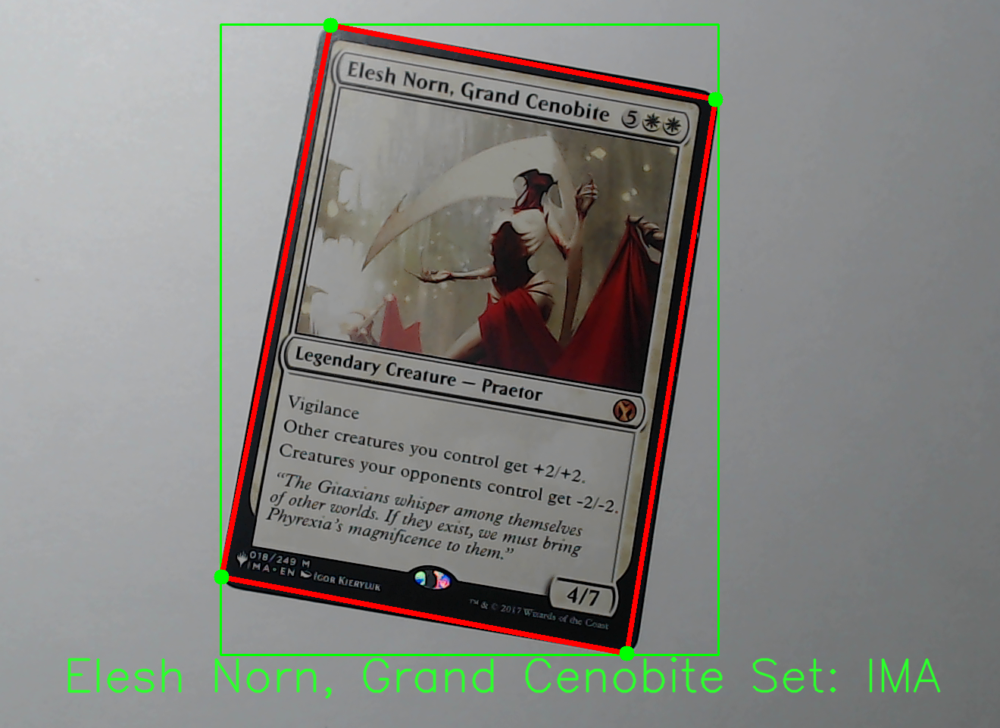

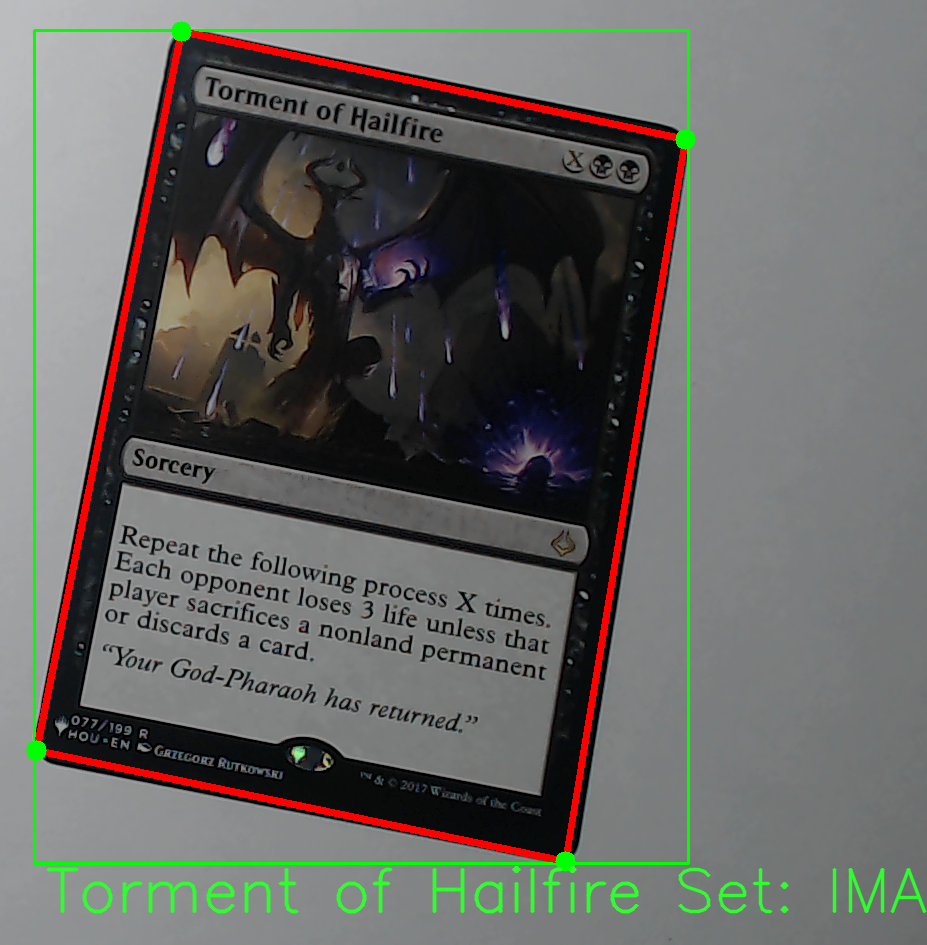

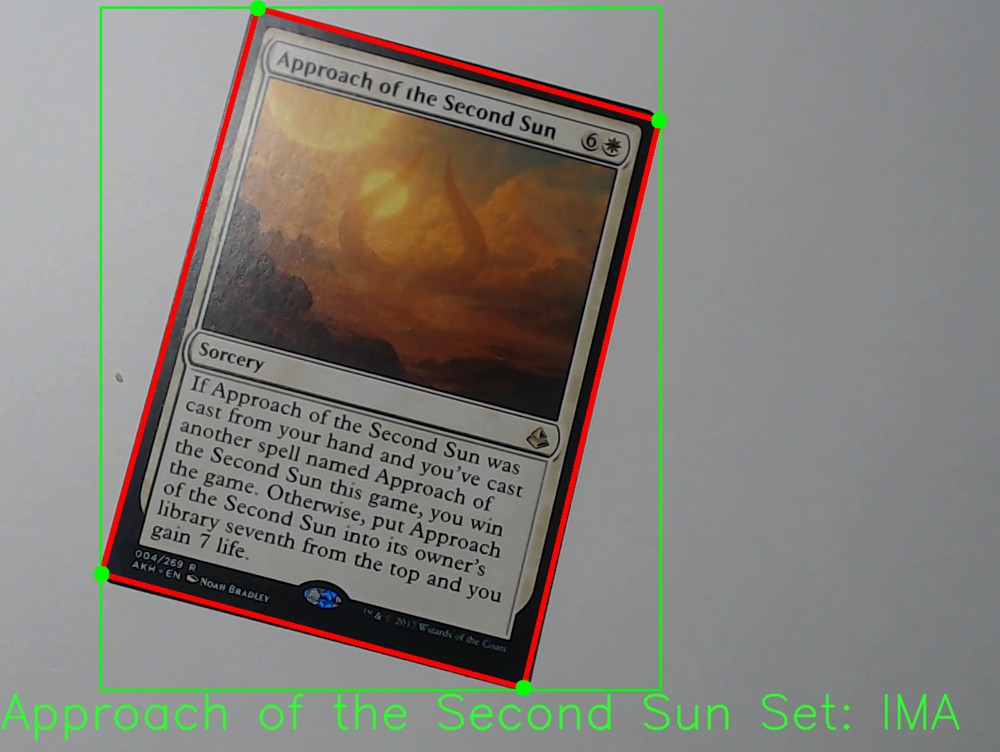

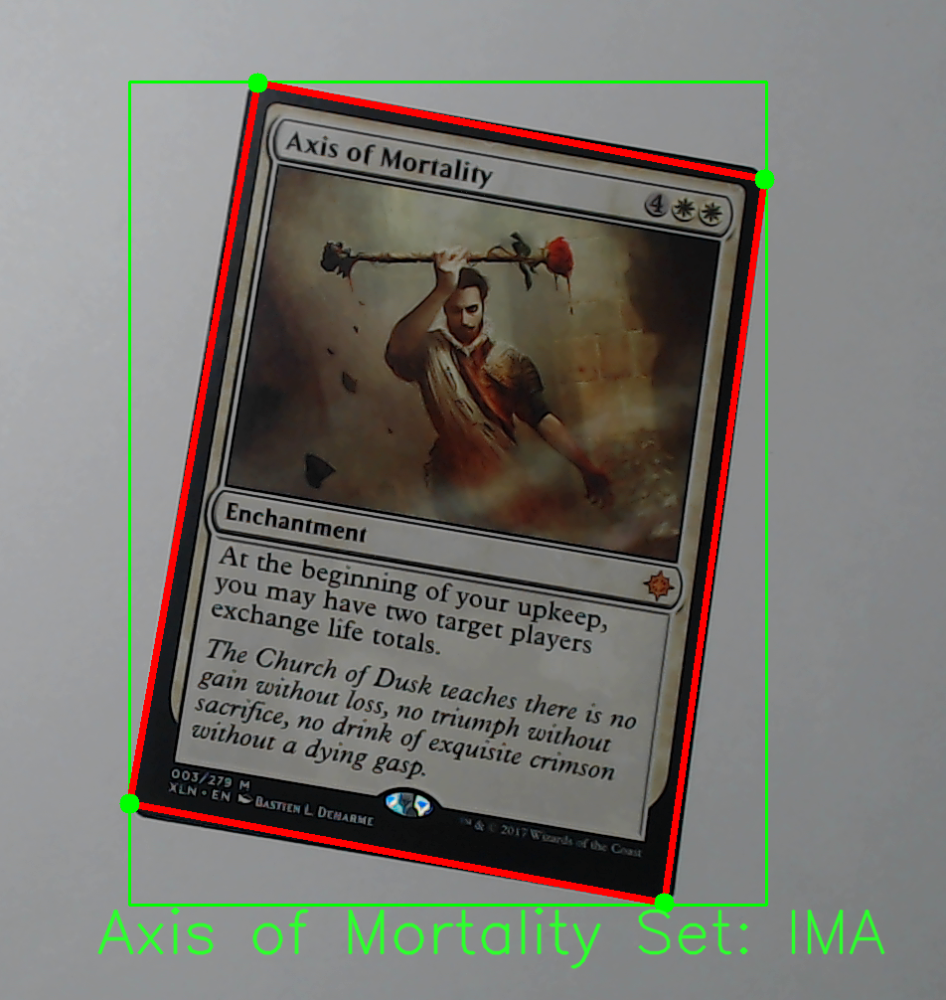

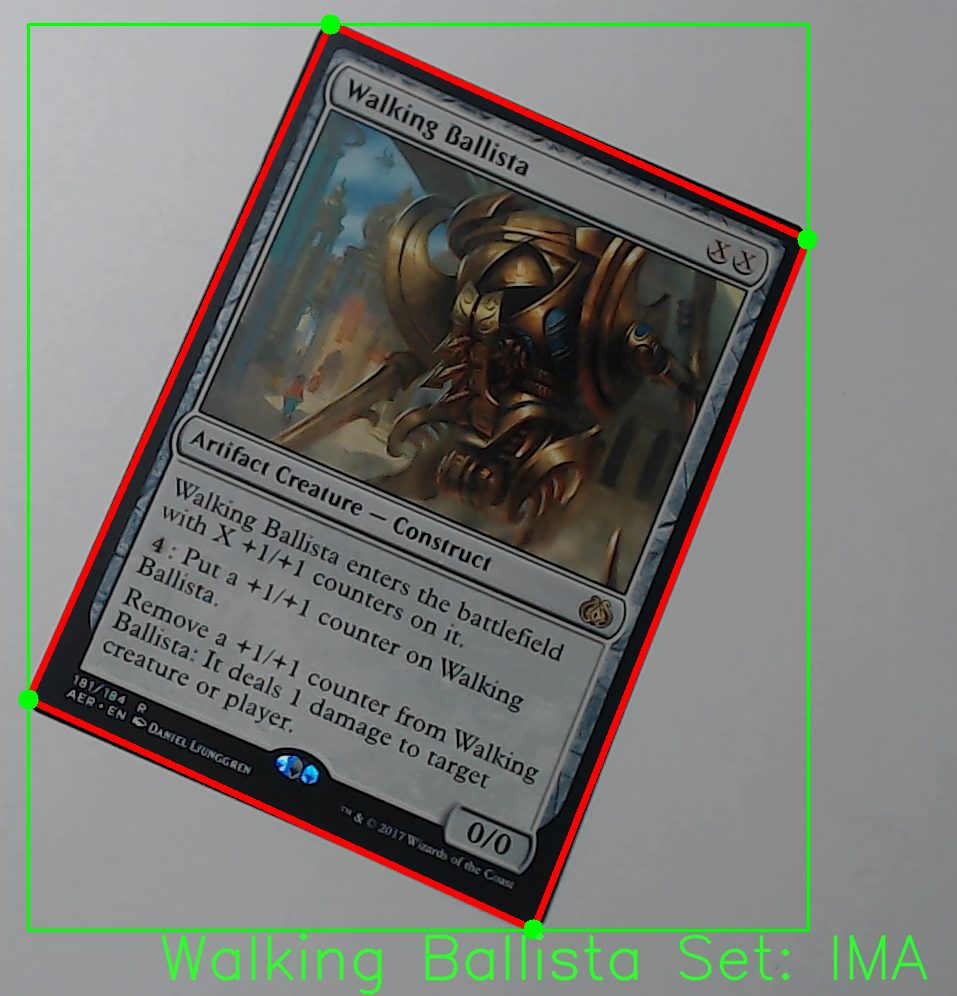

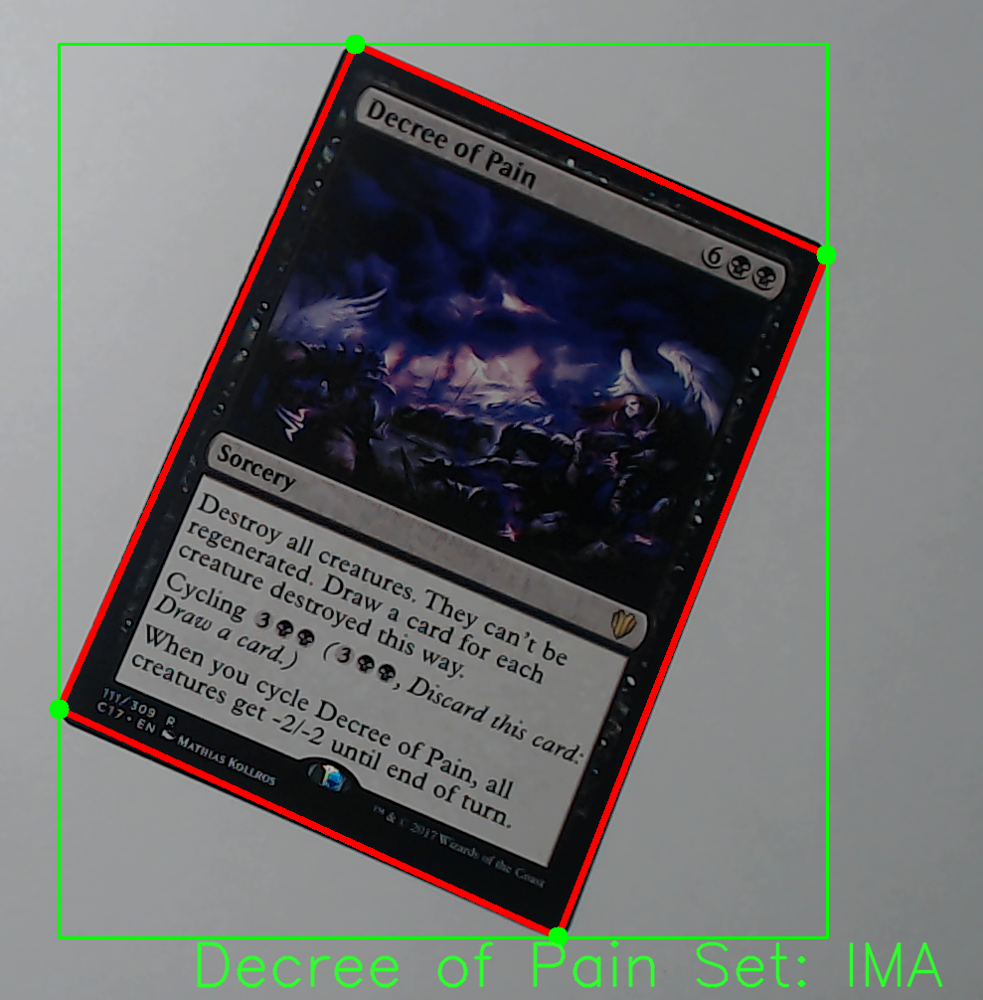

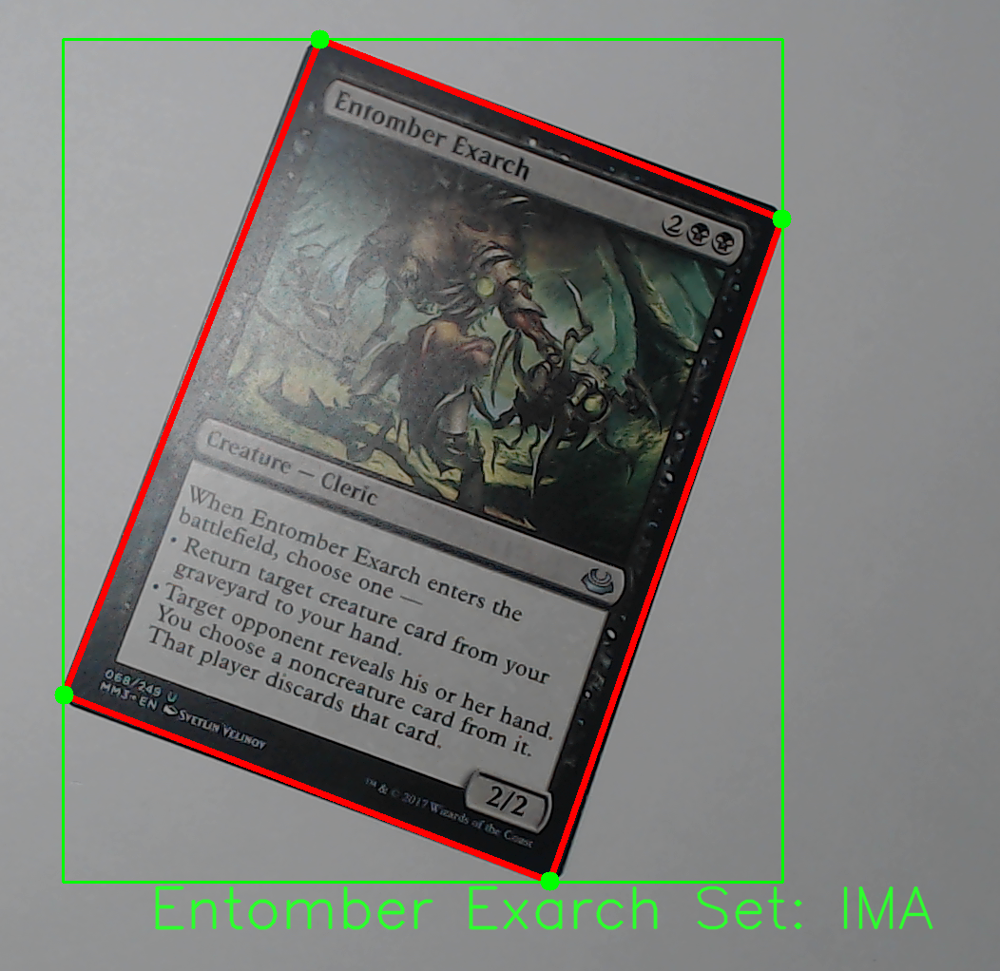


## Analyzing the results

Overall, the results are a mixed bag. The text detection works near flawlessly. Internally there are typos, but by the time the Sryfall Api does the heavy lifting, the text comes out looking exactly as it should on the card.

The issue comes from the set detection which I have a few theories about. The issue with the IMA set, Iconic Masters, is that it is the largest set symbol out of the bunch. Additionally its primarily a circle, with some wide inner gaps. I assume that due to its shape, being large and with the most defined angles, most fuzzy interpretations are believed to be Iconic Masters. This is obviously an issue when trying to interpret the proper set symbol.

I think to correct this, ideally, I would have a better camera to maybe find the edges better. I could also attempt to-do gray scaling in the future to minimize the error from wrong colors. The emblems vary in color depending on the rarity, though in training I did not see this as an issue. This could require some more analysis at the training level. Another way to-do it could also be cleaning up the Symbol area using some form of canny edge detection to get the outlines of the symbol, rather than attempting to interpret the entire symbol.  

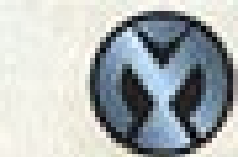

##### Iconic Masters Symbol

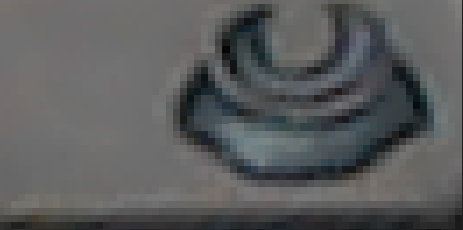

##### Modern Masters Symbol

### Things to improve

Over the process of this, I saw several things I could improve on. The first idea is that I could attempt to get the custom Magic the Gathering font running proper for the text recognition. It may not be much, but running it could slightly improve the text recognition on the title of the card, and rely less on the Scryfall Call.

Another thing that obviously needs improvement is the Emblem Detection and output. With improvement, I could have the set extractor working, which would more reliably tell us what the cards set is from, rather than strictly relying on the emblem. However, the emblem detection itself is still one of the most difficult parts of this. I think partially this is due to the Iconic Masters symbol being so big, and having a very sharp angular design that the network picks up easily.

An improvement would be to either use a better camera if available, to attempt to get the emblems more clearly, or train the network with augments on the images to try to give it more training with slightly changed emblems. The cropping also is another weak point at this stage. The crop job is done with static parameters to cut off a certain percent of the card. This percent is calcualted from each side, shearing off a certain percentage of the total image until we have just the emblem. Depending on how the card is formatted this can change the positioning of the emblem which can select the Neural Network. 

Another way to improve past this would be to simply make a text recognition tool trained on the emblems themselves. The emblems can be thought of as letters, representing sets instead of a sound. The only issue with this is it could be a bit more complex than English’s letters as instead of 26 total letters, there are well over 100 letters to represent each set in MTG. Another issue with this is that several of them have extremely similar symbols, further making the emblem identification harder. 

Another improvement is obviously the fact that the code is not asynchronous. When an image loads, the image is not updated until multiple calls to Scryfall are complete, and that the Neural Network runs to attempt to identify the image. This led to massive slowdowns in testing.

## Conclusions

I think overall, this project has been a success. While the emblem detection does not work well, the framework of the set identification has been set for me to further improve upon. I learned a lot about the OCR during this process, as well as general computer vision techniques, such as the canny edge detection, the kernel filters, general filtering, and the way to build a classifier in Pytorch. 

At the end of this, this is not a fully-fledged card detector yet, but I hope to take this framework, and improve it until I can efficiently use it for my own personal card collection.

All code is included in the zip

**Note OpenCV was built on my machine using a version compiled with Cuda support to attempt speedup of images. It will not run without this, unless the flag of self.gpu is set to False**


### References

https://github.com/EdjeElectronics/OpenCV-Playing-Card-Detector/tree/master 

https://pytorch.org/

https://scryfall.com/docs/api


In [1]:
import io
import nbformat
import glob
nbfile = glob.glob('Project Report.ipynb')
if len(nbfile) > 1:
    print('More than one ipynb file. Using the first one.  nbfile=', nbfile)
with io.open(nbfile[0], 'r', encoding='utf-8') as f:
    nb = nbformat.read(f, nbformat.NO_CONVERT)
word_count = 0
for cell in nb.cells:
    if cell.cell_type == "markdown":
        word_count += len(cell['source'].replace('#', '').lstrip().split(' '))
print('Word count for file', nbfile[0], 'is', word_count)

Word count for file Project Report.ipynb is 2262
